In [3]:
import shutil
import rasterio
import matplotlib.pyplot as plt
import numpy as np
from rasterio.plot import show, show_hist

In [3]:
#src = rasterio.open('D:\\L1_EFR_iCOR\\S3B_OL_1_EFR____20190921T135136_20190921T135436_20190922T173309_0179_030_124_3060_LN1_O_NT_002_processed.tif')

filepath = 'D:\\L1_EFR_iCOR\\S3B_OL_1_EFR____20190921T135136_20190921T135436_20190922T173309_0179_030_124_3060_LN1_O_NT_002_processed.tif'

with rasterio.open(filepath) as src:
    print(src.profile)
    oviews = src.overviews(1)
    oview = oviews[0]
    thumbnail = src.read(1, out_shape=(1, int(src.height // oview), int(src.width // oview)))

plt.imshow(thumbnail)
plt.colorbar()
plt.title('Overview - Band 4 {}'.format(thumbnail.shape))
plt.xlabel('Column #')
plt.ylabel('Row #')

RasterioIOError: D:\L1_EFR_iCOR\S3B_OL_1_EFR____20190921T135136_20190921T135436_20190922T173309_0179_030_124_3060_LN1_O_NT_002_processed.tif: No such file or directory

In [30]:
help(src)

Help on DatasetReader in module rasterio.io object:

class DatasetReader(rasterio._io.DatasetReaderBase, rasterio.windows.WindowMethodsMixin, rasterio.transform.TransformMethodsMixin)
 |  An unbuffered data and metadata reader
 |  
 |  Method resolution order:
 |      DatasetReader
 |      rasterio._io.DatasetReaderBase
 |      rasterio._base.DatasetBase
 |      rasterio.windows.WindowMethodsMixin
 |      rasterio.transform.TransformMethodsMixin
 |      builtins.object
 |  
 |  Methods defined here:
 |  
 |  __repr__(self)
 |      Return repr(self).
 |  
 |  ----------------------------------------------------------------------
 |  Data descriptors defined here:
 |  
 |  __dict__
 |      dictionary for instance variables (if defined)
 |  
 |  __weakref__
 |      list of weak references to the object (if defined)
 |  
 |  ----------------------------------------------------------------------
 |  Methods inherited from rasterio._io.DatasetReaderBase:
 |  
 |  __new__(*args, **kwargs) fro

## Masking NoData from S3

In [68]:
filepath = 'D:\\L1_EFR_iCOR\\S3B_OL_1_EFR____20190921T135136_20190921T135436_20190922T173309_0179_030_124_3060_LN1_O_NT_002_processed.tif'
tmp = shutil.copy(filepath, "D:\\processing\\tmp\\RGB.byte.tif")
src = rasterio.open(tmp, mode="r+")

# https://rasterio.readthedocs.io/en/latest/topics/masks.html

In [69]:
src.write_mask(True)
src.read_masks(1).all()

True

TypeError: Invalid shape (4866, 16, 4577) for image data

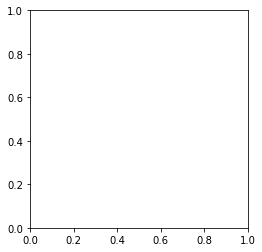

In [72]:
src.close()
tmp = shutil.copy(filepath, "D:\\processing\\tmp\\RGB.byte.tif")
src = rasterio.open(tmp, mode="r+")
msk = src.read_masks()
show(np.dstack(msk))  

In [64]:
src = rasterio.open(filepath)
print(src.shape)

print(src.count)

print(src.dtypes)

print(src.nodatavals)

print(src.nodata)

(4577, 4866)
16
('float32', 'float32', 'float32', 'float32', 'float32', 'float32', 'float32', 'float32', 'float32', 'float32', 'float32', 'float32', 'float32', 'float32', 'float32', 'float32')
(None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None)
None


In [33]:
plt.imshow(src.read(1), cmap='pink')
plt.show()

RasterioIOError: Dataset is closed: D:\L1_EFR_iCOR\S3B_OL_1_EFR____20190921T135136_20190921T135436_20190922T173309_0179_030_124_3060_LN1_O_NT_002_processed.tif

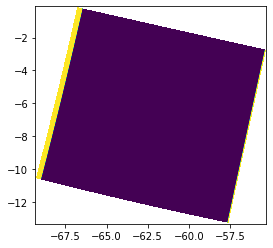

In [13]:
#RGB
show(src.read(7), transform=src.transform)

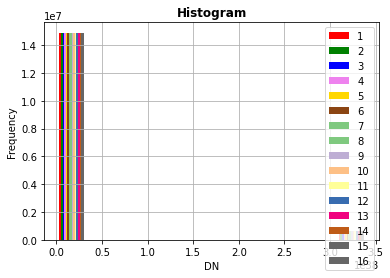

In [16]:
show_hist(src)

In [4]:
import os
import sys
import logging
import argparse

sys.path.append('../')

import tif_explorer
import outsourcing as outsrc
from rasterstats import zonal_stats
from datetime import datetime
from osgeo import ogr
from osgeo import gdal

from sklearn import cluster

# Tell GDAL to throw Python exceptions, and register all drivers
gdal.UseExceptions()
gdal.AllRegister()

In [38]:
# Read in raster image
filepath = 'D:\\L1_EFR_iCOR\\S3B_OL_1_EFR____20190921T135136_20190921T135436_20190922T173309_0179_030_124_3060_LN1_O_NT_002_processed.tif'

img_ds = gdal.Open(filepath, gdal.GA_ReadOnly)

print(img_ds.RasterCount)

16


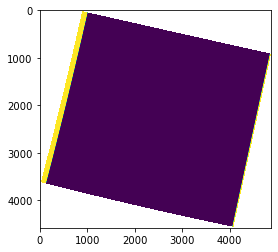

In [63]:
# S3 RGB = 9,6,4

band = img_ds.GetRasterBand(9)

img = band.ReadAsArray()

# img.DeleteNoDataValue()

plt.imshow(img)

In [62]:
tfxp = tif_explorer.TFXP()
tfxp.band_id

{1: 'B1-400',
 2: 'B2-412.5',
 3: 'B3-442.5',
 4: 'B4-490',
 5: 'B5-510',
 6: 'B6-560',
 7: 'B7-620',
 8: 'B8-665',
 9: 'B9-673.75',
 10: 'B10-681.25',
 11: 'B11-708.75',
 12: 'B12-753.75',
 13: 'B16-778.75',
 14: 'B17-865',
 15: 'B18-885',
 16: 'B21-1020'}

## Scatterplots

In [5]:
import os
import sys
import pandas as pd
import matplotlib.pyplot as plt

sys.path.append('../')
from tsgen import TsGenerator

In [6]:
tsgen = TsGenerator()

In [7]:
datafolders = ["D:\\processing\\win\\COARI",
              "D:\\processing\\win\\FONTE_BOA",
              "D:\\processing\\win\\MADEIRA",
              "D:\\processing\\win\\MANACAPURU",
              "D:\\processing\\win\\NEGRO",
              "D:\\processing\\win\\TEFE"]

In [10]:
os.listdir(datafolders[3])

['S3A_OL_2_WFR____20190309T141223_20190309T141523_20190310T211622_0179_042_167_3060_MAR_O_NT_002_subset.txt',
 'S3A_OL_2_WFR____20190310T134612_20190310T134912_20190311T222357_0180_042_181_3060_MAR_O_NT_002_subset.txt',
 'S3A_OL_2_WFR____20190313T140838_20190313T141138_20190314T214804_0179_042_224_3060_MAR_O_NT_002_subset.txt',
 'S3A_OL_2_WFR____20190314T134227_20190314T134527_20190315T222121_0179_042_238_3060_MAR_O_NT_002_subset.txt',
 'S3A_OL_2_WFR____20190317T140455_20190317T140755_20190318T205900_0179_042_281_3060_MAR_O_NT_002_subset.txt',
 'S3A_OL_2_WFR____20190318T133844_20190318T134144_20190319T213345_0179_042_295_3060_MAR_O_NT_002_subset.txt',
 'S3A_OL_2_WFR____20190325T135728_20190325T140028_20190326T224511_0179_043_010_3060_MAR_O_NT_002_subset.txt',
 'S3A_OL_2_WFR____20190329T135344_20190329T135644_20190330T223455_0179_043_067_3060_MAR_O_NT_002_subset.txt',
 'S3A_OL_2_WFR____20190330T132734_20190330T133034_20190331T220012_0179_043_081_3060_MAR_O_NT_002_subset.txt',
 'S3A_OL_2

In [11]:
len(os.listdir(datafolders[3]))

370

In [7]:
# subset_path = os.path.join(datafolders[0],os.listdir(datafolders[0])[0])
prettydate = 'S3B_OL_2_WFR____20191002T140633_20191002T140933_20191003T222714_0179_030_281_3060_MAR_O_NT_002_subset.txt'
# prettydate = 'S3A_OL_2_WFR____20191231T141226_20191231T141526_20200105T031511_0179_053_167_3060_MAR_O_NT_002_subset.txt'
# prettydate = 'S3B_OL_2_WFR____20200214T140633_20200214T140933_20200215T210517_0179_035_281_3060_MAR_O_NT_002_subset.txt'
subset_path = os.path.join(datafolders[0],prettydate)
subset_path

'D:\\processing\\win\\COARI\\S3B_OL_2_WFR____20191002T140633_20191002T140933_20191003T222714_0179_030_281_3060_MAR_O_NT_002_subset.txt'

In [8]:
# read text file and convert to pandas dataframe
df = pd.read_csv(subset_path, sep='\t', skiprows=1)

In [9]:
df.columns.values

array(['featureId', 'Oa01_reflectance:float',
       'Oa01_reflectance_err:float', 'Oa02_reflectance:float',
       'Oa02_reflectance_err:float', 'Oa03_reflectance:float',
       'Oa03_reflectance_err:float', 'Oa04_reflectance:float',
       'Oa04_reflectance_err:float', 'Oa05_reflectance:float',
       'Oa05_reflectance_err:float', 'Oa06_reflectance:float',
       'Oa06_reflectance_err:float', 'Oa07_reflectance:float',
       'Oa07_reflectance_err:float', 'Oa08_reflectance:float',
       'Oa08_reflectance_err:float', 'Oa09_reflectance:float',
       'Oa09_reflectance_err:float', 'Oa10_reflectance:float',
       'Oa10_reflectance_err:float', 'Oa11_reflectance:float',
       'Oa11_reflectance_err:float', 'Oa12_reflectance:float',
       'Oa12_reflectance_err:float', 'Oa16_reflectance:float',
       'Oa16_reflectance_err:float', 'Oa17_reflectance:float',
       'Oa17_reflectance_err:float', 'Oa18_reflectance:float',
       'Oa18_reflectance_err:float', 'Oa21_reflectance:float',
       'O

In [10]:
df['longitude:double'][1000:1005]

1000    0.0
1001    0.0
1002    0.0
1003    0.0
1004    0.0
Name: longitude:double, dtype: float64

In [11]:
# Get names of indexes for which column LON has value 0
indexNames = df[ df['longitude:double'] == 0 ].index
indexNames.shape

(10509,)

In [12]:
# Delete these row indexes from dataFrame
df.drop(indexNames , inplace=True)

In [13]:
df.shape

(831, 158)

In [14]:
df['TP_longitude:float'].max()

-62.418130000000005

In [15]:
df['TP_longitude:float'].min()

-62.792805

In [16]:
df['TP_latitude:float'].max()

-3.8095167

In [17]:
df['TP_latitude:float'].min()

-3.9123144

In [18]:
plt.rcParams['figure.figsize']

[6.0, 4.0]

In [46]:
plt.rcParams['figure.figsize'] = [8.0, 6.0]

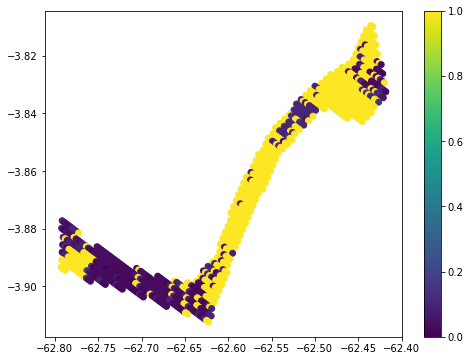

In [74]:
plt.scatter(df['TP_longitude:float'],df['TP_latitude:float'],c=df['Oa17_reflectance:float'])
plt.colorbar()

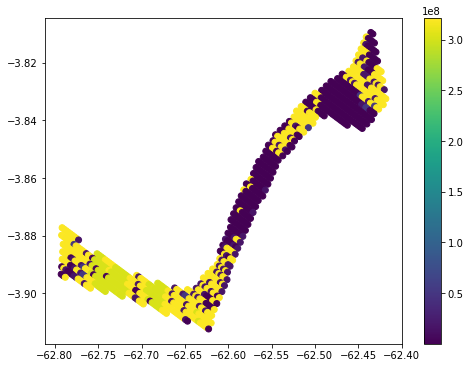

In [75]:
plt.scatter(df['TP_longitude:float'],df['TP_latitude:float'],c=df['WQSF_lsb:double'])
plt.colorbar()

In [48]:
df['WQSF_lsb:double'].min()

8.0

(array([  831.,     0.,     0.,     0.,     0.,     0.,     0.,     0.,
            0., 10509.]),
 array([8.00000000e+00, 4.29496737e+08, 8.58993465e+08, 1.28849019e+09,
        1.71798692e+09, 2.14748365e+09, 2.57698038e+09, 3.00647711e+09,
        3.43597384e+09, 3.86547057e+09, 4.29496729e+09]),
 <a list of 10 Patch objects>)

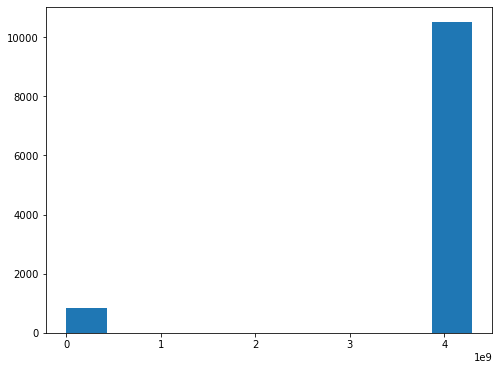

In [28]:
plt.hist(df['WQSF_lsb:double'])

In [109]:
len(df[df['WQSF_lsb:double']==40])

0

In [80]:
len(df[df['WQSF_lsb:double']==8])

8

In [83]:
len(df[df['WQSF_lsb:double']<=40])

302

In [107]:
for n,i in enumerate(df['WQSF_lsb:double'].unique()):
    print(n,':',i,"{0:b}".format(i))

ValueError: Unknown format code 'b' for object of type 'float'

In [27]:
# https://sentinel.esa.int/web/sentinel/technical-guides/sentinel-3-olci/level-2/quality-and-science-flags-op
float_flag_masks = {'INVALID':1.0,
                    'WATER':2.0,
                    'LAND':4.0,
                    'CLOUD':8.0, #
                    'CLOUD_AMBIGUOUS':8388608.0, #
                    'CLOUD_MARGIN':16777216.0, #
                    'SNOW_ICE':16.0, #
                    'INLAND_WATER':32.0,
                    'TIDAL':64.0,
                    'COSMETIC':128.0,
                    'SUSPECT':256.0, #
                    'HISOLZEN':512.0,
                    'SATURATED':1024.0, #
                    'MEGLINT':2048.0,
                    'HIGHGLINT':4096.0, #
                    'WHITECAPS':8192.0,
                    'ADJAC':16384.0,
                    'WV_FAIL':32768.0,
                    'PAR_FAIL':65536.0,
                    'AC_FAIL':131072.0,
                    'OC4ME_FAIL':262144.0,
                    'OCNN_FAIL':524288.0,
                    'KDM_FAIL':2097152.0,
                    'BPAC_ON':33554432.0,
                    'WHITE_SCATT':67108864.0,
                    'LOWRW':134217728.0,
                    'HIGHRW':268435456.0,
                    'ANNOT_ANGSTROM':4294967296.0, #
                    'ANNOT_AERO_B':8589934592.0,
                    'ANNOT_ABSO_D':17179869184.0,
                    'ANNOT_ACLIM':34359738368.0,
                    'ANNOT_ABSOA':68719476736.0,
                    'ANNOT_MIXR1':137438953472.0,
                    'ANNOT_DROUT':274877906944.0,
                    'ANNOT_TAU06':549755813888.0,
                    'RWNEG_O1':1099511627776.0,
                    'RWNEG_O2':2199023255552.0,
                    'RWNEG_O3':4398046511104.0,
                    'RWNEG_O4':8796093022208.0,
                    'RWNEG_O5':17592186044416.0,
                    'RWNEG_O6':35184372088832.0,
                    'RWNEG_O7':70368744177664.0,
                    'RWNEG_O8':140737488355328.0,
                    'RWNEG_O9':281474976710656.0,
                    'RWNEG_O10':562949953421312.0,
                    'RWNEG_O11':1125899906842624.0,
                    'RWNEG_O12':2251799813685248.0,
                    'RWNEG_O16':4503599627370496.0,
                    'RWNEG_O17':9007199254740992.0,
                    'RWNEG_O18':18014398509481984.0,
                    'RWNEG_O21':36028797018963968.0}

In [29]:
for n,i in enumerate(df['WQSF_lsb:double'].unique()):
    print(n,':',i, list(flag_masks.keys())[list(flag_masks.values()).index(i)])

ValueError: 4294967294.0 is not in list

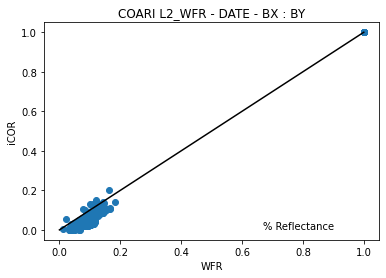

In [19]:
fig = plt.figure()
ax = plt.axes()
ax.set_title('COARI L2_WFR - DATE - BX : BY')

ax.scatter(df['Oa08_reflectance:float'],df['Oa17_reflectance:float'])

ax.plot( [0,1],[0,1],'k-' )
ax.set_xlabel('WFR')
ax.set_ylabel('iCOR')
plt.text(0.67,0.006,'% Reflectance')
# plt.savefig('D:\\processing\\win\\a1_plots\\tefe-icor-vs-wfr-sktr-b17.png', dpi=300)
plt.show()

# For further plotting it with annotations on each point:
# https://stackoverflow.com/questions/14432557/matplotlib-scatter-plot-with-different-text-at-each-data-point

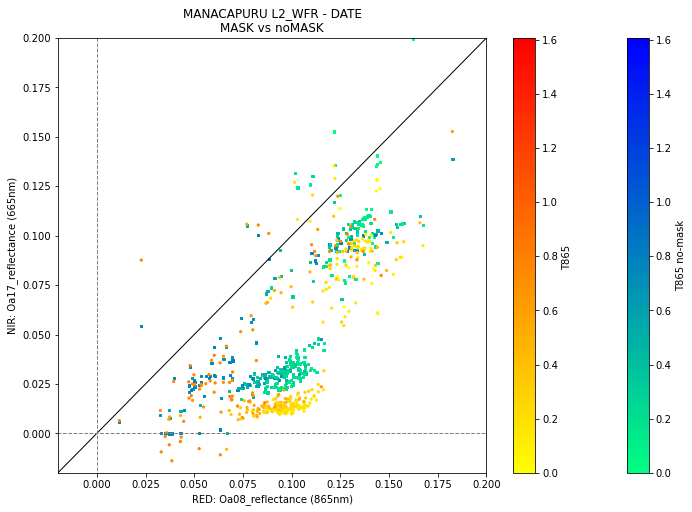

In [54]:
plt.rcParams['figure.figsize'] = [12, 8]
fig = plt.figure()
ax = plt.axes()
ax.set_title('MANACAPURU L2_WFR - DATE\nMASK vs noMASK')

# ax.scatter(df['Oa08_reflectance:float'],df['Oa21_reflectance:float'],s=3,c=df['T865:float'])
img = ax.scatter(df['Oa08_reflectance:float'],df['Oa17_reflectance:float'],s=5,marker='s',c=df['T865:float'],cmap='winter_r')
cbar = fig.colorbar(img, ax=ax)
cbar.set_label('T865 no-mask')
img = ax.scatter(df['Oa08_reflectance:float'],df['Oa21_reflectance:float'],s=5,c=df['T865:float'],cmap='autumn_r')
cbar = fig.colorbar(img, ax=ax)
cbar.set_label('T865 ')

ax.plot( [-1,1],[-1,1],'k-', linewidth=1)
ax.plot( [0,0],[-1,1], c='grey', linestyle='dashed', linewidth=1)
ax.plot( [-1,1],[0,0], c='grey', linestyle='dashed', linewidth=1)

# ax.set_xlabel('Oa08: 665 nm')
# ax.set_ylabel('Oa17: 865 nm')

ax.set_xlabel('RED: Oa08_reflectance (865nm)')
ax.set_ylabel('NIR: Oa17_reflectance (665nm)')

ax.set_xlim(-0.02,0.2)
ax.set_ylim(-0.02,0.2)

# ax.set_xlim(-63,-62.3)
# ax.set_ylim(-4,-3.6)


# plt.text(0.160,0.003,'% Reflectance')

# plt.savefig('D:\\processing\\win\\a1_plots\\tefe-icor-vs-wfr-sktr-b17.png', dpi=300)
# fig.colorbar(img, ax=ax)
plt.show()

# For further plotting it with annotations on each point:
# https://stackoverflow.com/questions/14432557/matplotlib-scatter-plot-with-different-text-at-each-data-point

In [1]:
plt.rcParams['figure.figsize'] = [9.4, 8]
fig = plt.figure()
ax = plt.axes()
ax.set_title('COARI L2_WFR - DATE - BX : BY')

img = ax.scatter(df['Oa08_reflectance:float'],df['Oa21_reflectance:float'],s=3,c=df['T865:float'],
                vmin=0, vmax=0.6)
# img = ax.scatter(df['longitude:double'],df['latitude:double'],s=3,c=df['T865:float'])

ax.plot( [-1,1],[-1,1],'k-', linewidth=1)
ax.plot( [0,0],[-1,1], c='grey', linestyle='dashed', linewidth=1)
ax.plot( [-1,1],[0,0], c='grey', linestyle='dashed', linewidth=1)

ax.set_xlabel('Oa08: 665 nm')
ax.set_ylabel('Oa17: 865 nm')

# ax.set_xlabel('LON')
# ax.set_ylabel('LAT')

ax.set_xlim(-0.02,0.2)
ax.set_ylim(-0.02,0.2)

# ax.set_xlim(-63,-62.3)
# ax.set_ylim(-4,-3.6)


# plt.text(0.160,0.003,'% Reflectance')

# plt.savefig('D:\\processing\\win\\a1_plots\\tefe-icor-vs-wfr-sktr-b17.png', dpi=300)

fig.colorbar(img, ax=ax)
plt.show()

# For further plotting it with annotations on each point:
# https://stackoverflow.com/questions/14432557/matplotlib-scatter-plot-with-different-text-at-each-data-point

NameError: name 'plt' is not defined

In [147]:
stations = ["COARI", "FONTE_BOA", "MADEIRA", "MANACAPURU", "NEGRO", "TEFE"]

## Generating and saving scatters for MANACAPURU

In [1]:
workdir = 'D:\\processing\\win\\MANACAPURU'
savedir = 'D:\\processing\\win\\a1_plots\\mass_jm_scatter_cloudmask_on_WFR'

In [2]:
os.listdir(workdir)

NameError: name 'os' is not defined

In [105]:
len(os.listdir(workdir))

370

In [87]:
myday = 'S3B_OL_2_WFR____20190722T133256_20190722T133556_20190723T215914_0179_028_024_3060_MAR_O_NT_002_subset.txt'
complete_path = os.path.join(workdir,myday)
complete_path

'D:\\processing\\win\\MANACAPURU\\S3B_OL_2_WFR____20190722T133256_20190722T133556_20190723T215914_0179_028_024_3060_MAR_O_NT_002_subset.txt'

In [93]:
figdate = os.path.basename(complete_path).split('____')[1].split('_')[0]
figtitl = 'MANACAPURU WFR '+figdate
figtitl

'MANACAPURU WFR 20190722T133256'

In [99]:
os.path.join(savedir,figdate+'.png')

'D:\\processing\\win\\a1_plots\\mass_jm_scatter_cloudmask_on_WFR\\20190722T133256.png'

In [88]:
# read text file and convert to pandas dataframe
df = pd.read_csv(complete_path, sep='\t', skiprows=1)

# Get + Delete: indexes for which column LON has value 0
indexNames = df[ df['longitude:double'] == 0 ].index
df.drop(indexNames , inplace=True)

# Get + Delete: indexes for which column WQSF <= 40
indexNames = df[ df['WQSF_lsb:double'] <= 40 ].index
df.drop(indexNames , inplace=True)

len(df)

2598

In [89]:
def mass_sktr(xdata, ydata, xlabel, ylabel, color, clabel, title, savepathname):
    plt.rcParams['figure.figsize'] = [9.4, 8]
    fig = plt.figure()
    ax = plt.axes()
    ax.set_title(title)

    img = ax.scatter(xdata, ydata, s=3, c=color)

    ax.plot( [-1,1],[-1,1],'k-', linewidth=1)
    ax.plot( [0,0],[-1,1], c='grey', linestyle='dashed', linewidth=1)
    ax.plot( [-1,1],[0,0], c='grey', linestyle='dashed', linewidth=1)
    
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)

    ax.set_xlim(-0.02,0.2)
    ax.set_ylim(-0.02,0.2)
    plt.text(0.160,0.003,'% Reflectance')
    
    fig.colorbar(img, ax=ax)

    plt.savefig(savepathname)

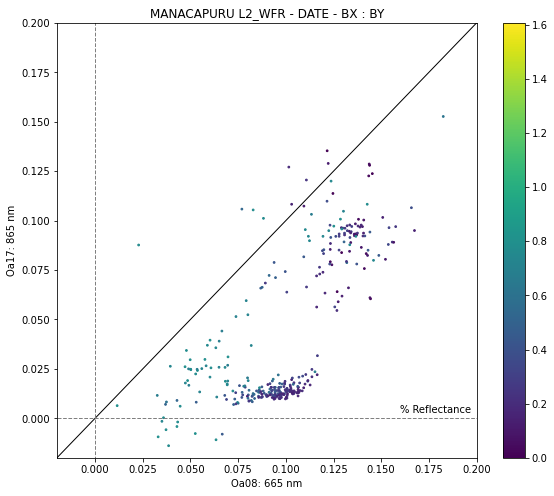

In [102]:
mass_sktr(xdata=df['Oa08_reflectance:float'],
          ydata=df['Oa21_reflectance:float'],
          xlabel='Oa08: 665 nm',
          ylabel='Oa17: 865 nm',
          color=df['T865:float'],
          clabel='T865',
          title='MANACAPURU L2_WFR - DATE - BX : BY',
          savepathname='D:\\processing\\win\\a1_plots\\mass_jm_scatter_cloudmask_on_WFR\\test01massplot.png')

Generating image: D:\processing\win\a1_plots\mass_jm_scatter_cloudmask_on_WFR\20190309T141223.png
Generating image: D:\processing\win\a1_plots\mass_jm_scatter_cloudmask_on_WFR\20190310T134612.png
Generating image: D:\processing\win\a1_plots\mass_jm_scatter_cloudmask_on_WFR\20190313T140838.png
Generating image: D:\processing\win\a1_plots\mass_jm_scatter_cloudmask_on_WFR\20190314T134227.png
Generating image: D:\processing\win\a1_plots\mass_jm_scatter_cloudmask_on_WFR\20190317T140455.png
Generating image: D:\processing\win\a1_plots\mass_jm_scatter_cloudmask_on_WFR\20190318T133844.png
Generating image: D:\processing\win\a1_plots\mass_jm_scatter_cloudmask_on_WFR\20190325T135728.png
Generating image: D:\processing\win\a1_plots\mass_jm_scatter_cloudmask_on_WFR\20190329T135344.png
Generating image: D:\processing\win\a1_plots\mass_jm_scatter_cloudmask_on_WFR\20190330T132734.png
Generating image: D:\processing\win\a1_plots\mass_jm_scatter_cloudmask_on_WFR\20190403T132350.png
Generating image: D:

C:\Users\david\.conda\envs\git-prj\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


Generating image: D:\processing\win\a1_plots\mass_jm_scatter_cloudmask_on_WFR\20190502T141231.png
Generating image: D:\processing\win\a1_plots\mass_jm_scatter_cloudmask_on_WFR\20190503T134620.png
Generating image: D:\processing\win\a1_plots\mass_jm_scatter_cloudmask_on_WFR\20190510T140503.png
Generating image: D:\processing\win\a1_plots\mass_jm_scatter_cloudmask_on_WFR\20190518T135734.png
Generating image: D:\processing\win\a1_plots\mass_jm_scatter_cloudmask_on_WFR\20190519T133123.png
Generating image: D:\processing\win\a1_plots\mass_jm_scatter_cloudmask_on_WFR\20190522T135349.png
Generating image: D:\processing\win\a1_plots\mass_jm_scatter_cloudmask_on_WFR\20190523T132739.png
Generating image: D:\processing\win\a1_plots\mass_jm_scatter_cloudmask_on_WFR\20190526T135005.png
Generating image: D:\processing\win\a1_plots\mass_jm_scatter_cloudmask_on_WFR\20190527T132354.png
Generating image: D:\processing\win\a1_plots\mass_jm_scatter_cloudmask_on_WFR\20190529T141231.png
Generating image: D:

Generating image: D:\processing\win\a1_plots\mass_jm_scatter_cloudmask_on_WFR\20191024T133505.png
Generating image: D:\processing\win\a1_plots\mass_jm_scatter_cloudmask_on_WFR\20191027T135731.png
Generating image: D:\processing\win\a1_plots\mass_jm_scatter_cloudmask_on_WFR\20191028T133120.png
Generating image: D:\processing\win\a1_plots\mass_jm_scatter_cloudmask_on_WFR\20191031T135347.png
Generating image: D:\processing\win\a1_plots\mass_jm_scatter_cloudmask_on_WFR\20191101T132736.png
Generating image: D:\processing\win\a1_plots\mass_jm_scatter_cloudmask_on_WFR\20191104T135002.png
Generating image: D:\processing\win\a1_plots\mass_jm_scatter_cloudmask_on_WFR\20191105T132351.png
Generating image: D:\processing\win\a1_plots\mass_jm_scatter_cloudmask_on_WFR\20191107T141228.png
Generating image: D:\processing\win\a1_plots\mass_jm_scatter_cloudmask_on_WFR\20191108T134617.png
Generating image: D:\processing\win\a1_plots\mass_jm_scatter_cloudmask_on_WFR\20191111T140843.png
Generating image: D:

Generating image: D:\processing\win\a1_plots\mass_jm_scatter_cloudmask_on_WFR\20190320T134757.png
Generating image: D:\processing\win\a1_plots\mass_jm_scatter_cloudmask_on_WFR\20190323T141024.png
Generating image: D:\processing\win\a1_plots\mass_jm_scatter_cloudmask_on_WFR\20190324T134413.png
Generating image: D:\processing\win\a1_plots\mass_jm_scatter_cloudmask_on_WFR\20190327T140640.png
Generating image: D:\processing\win\a1_plots\mass_jm_scatter_cloudmask_on_WFR\20190328T134029.png
Generating image: D:\processing\win\a1_plots\mass_jm_scatter_cloudmask_on_WFR\20190331T140256.png
Generating image: D:\processing\win\a1_plots\mass_jm_scatter_cloudmask_on_WFR\20190401T133645.png
Generating image: D:\processing\win\a1_plots\mass_jm_scatter_cloudmask_on_WFR\20190404T135911.png
Generating image: D:\processing\win\a1_plots\mass_jm_scatter_cloudmask_on_WFR\20190405T133300.png
Generating image: D:\processing\win\a1_plots\mass_jm_scatter_cloudmask_on_WFR\20190409T132916.png
Generating image: D:

C:\Users\david\.conda\envs\git-prj\lib\site-packages\IPython\core\interactiveshell.py:3063: DtypeWarning: Columns (59) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


Generating image: D:\processing\win\a1_plots\mass_jm_scatter_cloudmask_on_WFR\20190505T135526.png
Generating image: D:\processing\win\a1_plots\mass_jm_scatter_cloudmask_on_WFR\20190512T141407.png
Generating image: D:\processing\win\a1_plots\mass_jm_scatter_cloudmask_on_WFR\20190513T134756.png
Generating image: D:\processing\win\a1_plots\mass_jm_scatter_cloudmask_on_WFR\20190516T141022.png
Generating image: D:\processing\win\a1_plots\mass_jm_scatter_cloudmask_on_WFR\20190517T134411.png
Generating image: D:\processing\win\a1_plots\mass_jm_scatter_cloudmask_on_WFR\20190521T134026.png
Generating image: D:\processing\win\a1_plots\mass_jm_scatter_cloudmask_on_WFR\20190524T140252.png
Generating image: D:\processing\win\a1_plots\mass_jm_scatter_cloudmask_on_WFR\20190525T133641.png
Generating image: D:\processing\win\a1_plots\mass_jm_scatter_cloudmask_on_WFR\20190528T135906.png
Generating image: D:\processing\win\a1_plots\mass_jm_scatter_cloudmask_on_WFR\20190529T133255.png
Generating image: D:

Generating image: D:\processing\win\a1_plots\mass_jm_scatter_cloudmask_on_WFR\20191029T140633.png
Generating image: D:\processing\win\a1_plots\mass_jm_scatter_cloudmask_on_WFR\20191030T134022.png
Generating image: D:\processing\win\a1_plots\mass_jm_scatter_cloudmask_on_WFR\20191102T140249.png
Generating image: D:\processing\win\a1_plots\mass_jm_scatter_cloudmask_on_WFR\20191103T133638.png
Generating image: D:\processing\win\a1_plots\mass_jm_scatter_cloudmask_on_WFR\20191106T135905.png
Generating image: D:\processing\win\a1_plots\mass_jm_scatter_cloudmask_on_WFR\20191107T133255.png
Generating image: D:\processing\win\a1_plots\mass_jm_scatter_cloudmask_on_WFR\20191110T135522.png
Generating image: D:\processing\win\a1_plots\mass_jm_scatter_cloudmask_on_WFR\20191111T132911.png
Generating image: D:\processing\win\a1_plots\mass_jm_scatter_cloudmask_on_WFR\20191114T135138.png
Generating image: D:\processing\win\a1_plots\mass_jm_scatter_cloudmask_on_WFR\20191115T132527.png
Generating image: D:

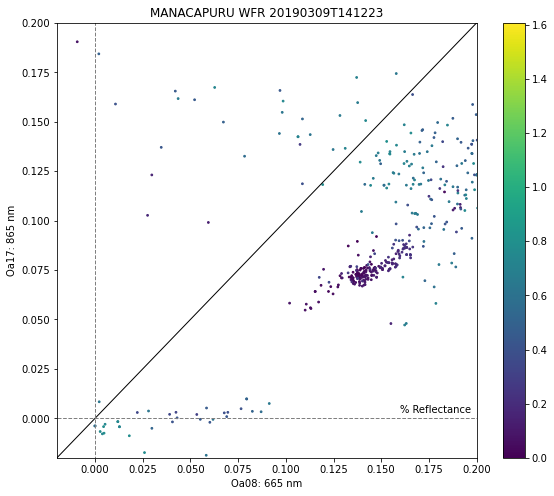

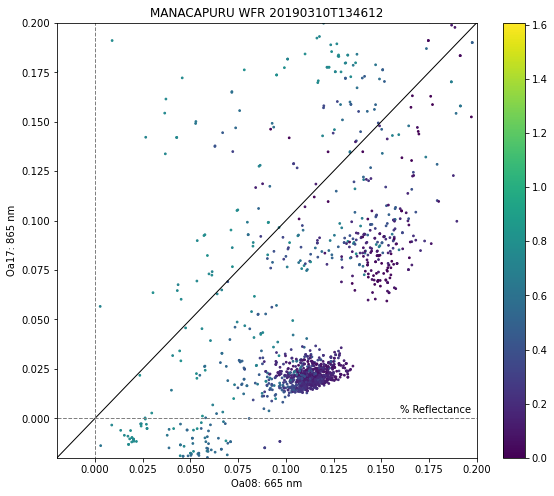

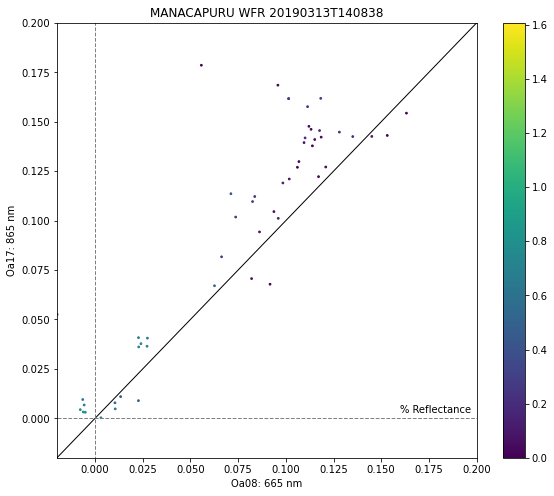

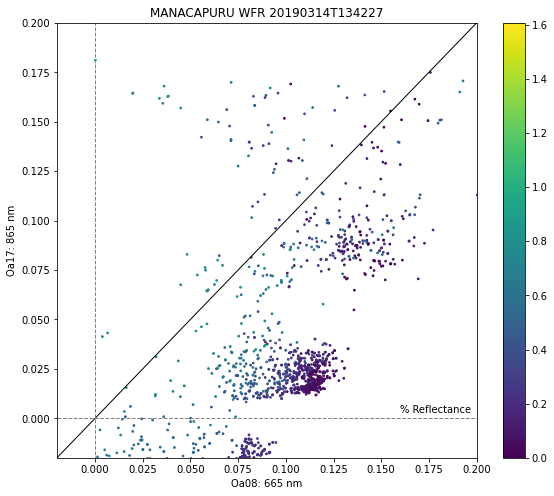

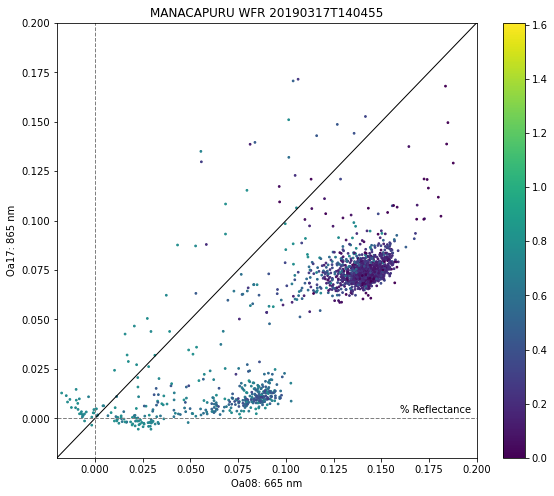

...

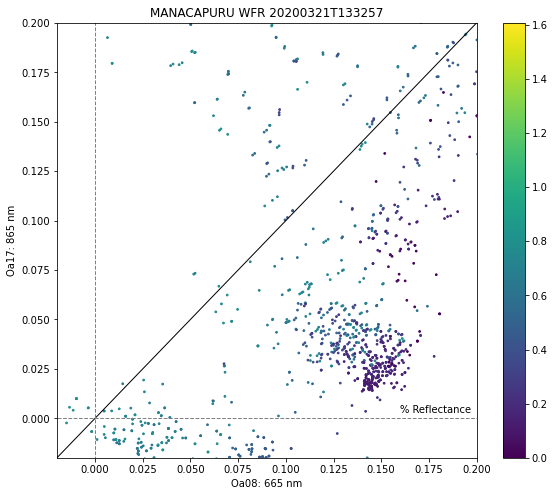

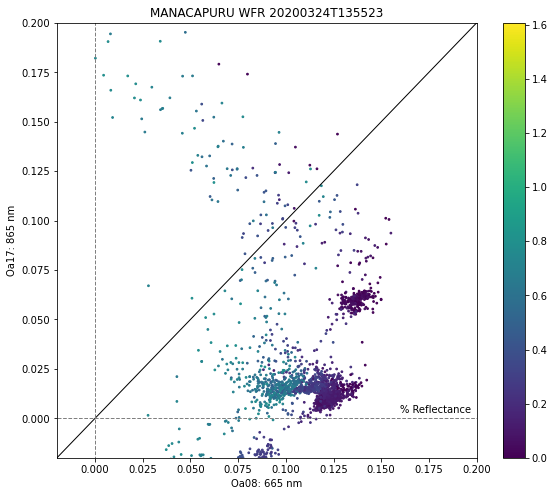

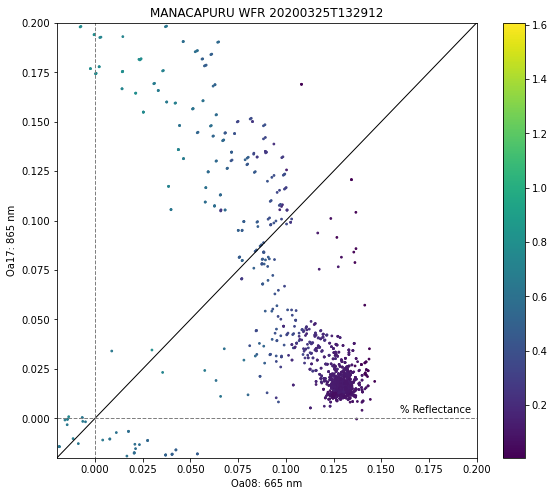

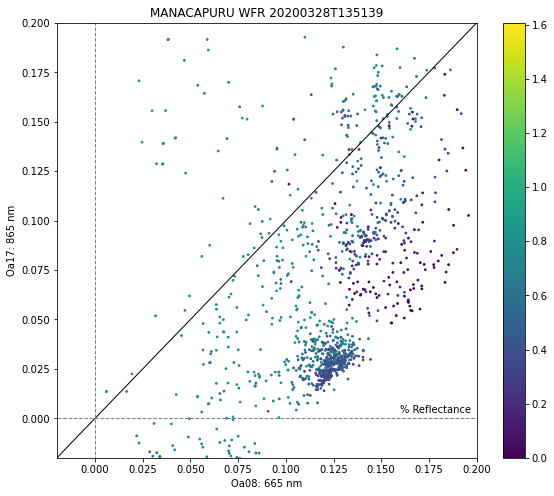

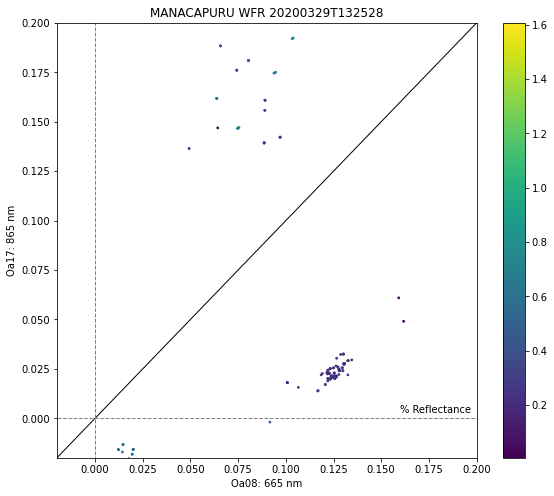

In [106]:
for img in os.listdir(workdir):
    
    # get complete path + filename
    complete_path = os.path.join(workdir,img)
    
    # read text file and convert to pandas dataframe
    df = pd.read_csv(complete_path, sep='\t', skiprows=1)
    
    # Get + Delete: indexes for which column LON has value 0
    indexNames = df[ df['longitude:double'] == 0 ].index
    df.drop(indexNames , inplace=True)
    
    # Get + Delete: indexes for which column WQSF <= 40
    indexNames = df[ df['WQSF_lsb:double'] <= 40 ].index
    df.drop(indexNames , inplace=True)
    
    # fig params
    figdate = os.path.basename(img).split('____')[1].split('_')[0]
    figtitl = 'MANACAPURU WFR '+figdate
    savpt = os.path.join(savedir,figdate+'.png')
    
    print(f'Generating image: {savpt}')
    
    # ------- generate plot
    mass_sktr(xdata=df['Oa08_reflectance:float'],
              ydata=df['Oa21_reflectance:float'],
              xlabel='Oa08: 665 nm',
              ylabel='Oa17: 865 nm',
              color=df['T865:float'],
              clabel='T865',
              title=figtitl,
              savepathname=savpt)